In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Tensorflow-Models

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1oP3ewZgiatY88SU5esvVcTCqbdfjYu1d/Tensorflow-Models


In [ ]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("/content/gdrive/MyDrive/Pytorch-Models/datasets/soybean_weeds/train/images")
count_images("/content/gdrive/MyDrive/Pytorch-Models/datasets/soybean_weeds/train/masks")
count_images("/content/gdrive/MyDrive/Pytorch-Models/datasets/soybean_weeds/valid/images")
count_images("/content/gdrive/MyDrive/Pytorch-Models/datasets/soybean_weeds/valid/masks")

Total images: 1398
Total images: 1398
Total images: 350
Total images: 350


In [ ]:
import os
import random
import keras
import tensorflow as tf
from tensorflow import data as tf_data
from tensorflow import image as tf_image
from tensorflow import io as tf_io

# Paths
train_images_dir = "/content/gdrive/MyDrive/Pytorch-Models/datasets/soybean_weeds/train/images"
train_masks_dir  = "/content/gdrive/MyDrive/Pytorch-Models/datasets/soybean_weeds/train/masks"
valid_images_dir = "/content/gdrive/MyDrive/Pytorch-Models/datasets/soybean_weeds/valid/images"
valid_masks_dir  = "/content/gdrive/MyDrive/Pytorch-Models/datasets/soybean_weeds/valid/masks"

# Hyperparameters
img_size = (384, 384)
batch_size = 16 # Reduced batch size to prevent OOM

# Collect paths
def get_image_mask_paths(image_dir, mask_dir, img_exts={".jpg", ".jpeg", ".png"}):
    image_paths = sorted(
        [
            os.path.join(image_dir, fname)
            for fname in os.listdir(image_dir)
            if os.path.splitext(fname)[1].lower() in img_exts
        ]
    )
    mask_paths = sorted(
        [
            os.path.join(mask_dir, fname)
            for fname in os.listdir(mask_dir)
            if fname.endswith(".png") and not fname.startswith(".")
        ]
    )
    return image_paths, mask_paths

train_input_img_paths, train_target_img_paths = get_image_mask_paths(train_images_dir, train_masks_dir)
val_input_img_paths, val_target_img_paths     = get_image_mask_paths(valid_images_dir, valid_masks_dir)

print(f"Train samples: {len(train_input_img_paths)}")
print(f"Valid samples: {len(val_input_img_paths)}")

# Dataset loader
def get_dataset(batch_size, img_size, input_img_paths, target_img_paths, max_dataset_len=None):
    """Returns a TF Dataset."""

    def load_img_masks(input_img_path, target_img_path):
        input_img = tf_io.read_file(input_img_path)
        input_img = tf_io.decode_image(input_img, channels=3, expand_animations=False)
        input_img = tf_image.resize(input_img, img_size)
        input_img = tf_image.convert_image_dtype(input_img, "float32")

        target_img = tf_io.read_file(target_img_path)
        target_img = tf_io.decode_image(target_img, channels=1, expand_animations=False)
        target_img = tf_image.resize(target_img, img_size, method="nearest")
        # keep masks as integer labels (do NOT normalize to float)
        target_img = tf.cast(target_img, tf.int32)

        return input_img, target_img

    if max_dataset_len:
        input_img_paths = input_img_paths[:max_dataset_len]
        target_img_paths = target_img_paths[:max_dataset_len]

    dataset = tf_data.Dataset.from_tensor_slices((list(input_img_paths), list(target_img_paths)))
    dataset = dataset.map(load_img_masks, num_parallel_calls=tf_data.AUTOTUNE)
    return dataset.batch(batch_size).prefetch(tf_data.AUTOTUNE)

# Build datasets
train_dataset = get_dataset(batch_size, img_size, train_input_img_paths, train_target_img_paths)
valid_dataset = get_dataset(batch_size, img_size, val_input_img_paths, val_target_img_paths)

Train samples: 1398
Valid samples: 350


In [ ]:
for images, masks in train_dataset.take(1):
    print(images.shape, masks.shape, masks.dtype, masks.numpy().min(), masks.numpy().max())

(16, 384, 384, 3) (16, 384, 384, 1) <dtype: 'int32'> 0 3


In [ ]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, UpSampling2D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50

def conv_block(inputs, filters):
    """Two Conv-BN-ReLU layers (decoder side)."""
    x = Conv2D(filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

def build_unet_resnet50(input_shape=(384, 384, 3), num_classes=4):
    """U-Net with ResNet50 backbone encoder."""

    # Pretrained ResNet50 as encoder
    base_model = ResNet50(weights="imagenet", include_top=False, input_shape=input_shape)

    # Extract feature maps from ResNet50 at different stages
    c1 = base_model.get_layer("conv1_relu").output     # 192x192
    c2 = base_model.get_layer("conv2_block3_out").output  # 96x96
    c3 = base_model.get_layer("conv3_block4_out").output  # 48x48
    c4 = base_model.get_layer("conv4_block6_out").output  # 24x24
    c5 = base_model.get_layer("conv5_block3_out").output  # 12x12 (bridge)

    # Decoder (U-Net style upsampling + skip connections)
    u1 = UpSampling2D((2, 2), interpolation="bilinear")(c5)
    u1 = Concatenate()([u1, c4])
    u1 = conv_block(u1, 512)

    u2 = UpSampling2D((2, 2), interpolation="bilinear")(u1)
    u2 = Concatenate()([u2, c3])
    u2 = conv_block(u2, 256)

    u3 = UpSampling2D((2, 2), interpolation="bilinear")(u2)
    u3 = Concatenate()([u3, c2])
    u3 = conv_block(u3, 128)

    u4 = UpSampling2D((2, 2), interpolation="bilinear")(u3)
    u4 = Concatenate()([u4, c1])
    u4 = conv_block(u4, 64)

    u5 = UpSampling2D((2, 2), interpolation="bilinear")(u4)
    u5 = conv_block(u5, 32)

    # Output segmentation map
    output = Conv2D(num_classes, 1, padding="same", activation="softmax")(u5)

    model = Model(inputs=base_model.input, outputs=output)

    return model

model = build_unet_resnet50(input_shape=(384, 384, 3), num_classes=4)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 390, 390,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 192, 192,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 192, 192,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 192, 192,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 194, 194,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 96, 96,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 96, 96,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 96, 96,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 96, 96,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 96, 96,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 96, 96,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 96, 96,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 96, 96,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 96, 96,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 96, 96,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 96, 96,    │      1,024 │ conv2_block1_3_c

 Total params: 43,974,340 (167.75 MB)

 Trainable params: 43,917,252 (167.53 MB)

 Non-trainable params: 57,088 (223.00 KB)

In [ ]:
import tensorflow as tf

class MeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, name="mean_iou", dtype=None):
        super().__init__(num_classes=num_classes, name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # y_pred: (batch, H, W, num_classes) -> class indices
        y_pred = tf.argmax(y_pred, axis=-1)
        y_pred = tf.cast(y_pred, tf.int32)

        # y_true: (batch, H, W, 1) -> squeeze to (batch, H, W)
        y_true = tf.squeeze(y_true, axis=-1)
        y_true = tf.cast(y_true, tf.int32)

        return super().update_state(y_true, y_pred, sample_weight)

In [ ]:
import tensorflow as tf
from tensorflow import keras

def dice_loss(y_true, y_pred, smooth=1e-6):
    """
    Per-class Dice loss
    y_true: (B,H,W,1) with integer labels
    y_pred: (B,H,W,C) softmax outputs
    """
    num_classes = tf.shape(y_pred)[-1]
    y_true_onehot = tf.one_hot(tf.cast(y_true[..., 0], tf.int32), num_classes)

    # Flatten
    y_true_f = tf.reshape(y_true_onehot, [-1, num_classes])
    y_pred_f = tf.reshape(y_pred, [-1, num_classes])

    # Intersection and denominator per class
    intersection = tf.reduce_sum(y_true_f * y_pred_f, axis=0)
    denom = tf.reduce_sum(y_true_f, axis=0) + tf.reduce_sum(y_pred_f, axis=0)

    dice_per_class = (2. * intersection + smooth) / (denom + smooth)
    loss_per_class = 1 - dice_per_class

    return tf.reduce_mean(loss_per_class)  # mean over classes


def ce_dice_loss(y_true, y_pred, alpha=0.7, beta=0.3):
    """
    Weighted combo of CE and Dice.
    alpha=weight for CE (classification),
    beta=weight for Dice (shape/overlap).
    """
    ce = keras.losses.sparse_categorical_crossentropy(y_true, y_pred)
    ce = tf.reduce_mean(ce)  # scalar
    dice = dice_loss(y_true, y_pred)
    return alpha * ce + beta * dice

In [ ]:
for layer in model.layers[:143]:   # ResNet50 layers
    layer.trainable = False
for layer in model.layers[143:]:
    layer.trainable = True

model.compile(
    optimizer=keras.optimizers.Adam(1e-4),
    loss=lambda y_true, y_pred: ce_dice_loss(y_true, y_pred, alpha=0.7, beta=0.3),
    metrics=['accuracy', MeanIoU(num_classes=4)]
)
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
# When using `save_weights_only=True` in `ModelCheckpoint`, the filepath provided must end in `.weights.h5`
checkpoint_filepath = "unet_r50_segmentation.weights.h5"

In [ ]:
checkpoint_callback = [
        ModelCheckpoint(checkpoint_filepath, monitor="val_accuracy", save_best_only=True, save_weights_only=True),
        #ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.1, verbose=1, min_lr=1e-6),
        #EarlyStopping(monitor="val_loss", patience=5, verbose=1)
    ]

# Train the model, doing validation at the end of each epoch.
epochs = 10
history1 = model.fit(
    train_dataset,
    epochs=epochs,
    validation_data=valid_dataset,
    callbacks=checkpoint_callback,
    verbose=2,
)

Epoch 1/10
88/88 - 159s - 2s/step - accuracy: 0.8447 - loss: 0.7033 - mean_iou: 0.3430 - val_accuracy: 0.9499 - val_loss: 0.5613 - val_mean_iou: 0.4320
Epoch 2/10
88/88 - 171s - 2s/step - accuracy: 0.9202 - loss: 0.5276 - mean_iou: 0.3893 - val_accuracy: 0.9563 - val_loss: 0.3910 - val_mean_iou: 0.4366
Epoch 3/10
88/88 - 137s - 2s/step - accuracy: 0.9375 - loss: 0.4631 - mean_iou: 0.4103 - val_accuracy: 0.9588 - val_loss: 0.3512 - val_mean_iou: 0.4404
Epoch 4/10
88/88 - 104s - 1s/step - accuracy: 0.9486 - loss: 0.4196 - mean_iou: 0.4251 - val_accuracy: 0.9565 - val_loss: 0.3327 - val_mean_iou: 0.4380
Epoch 5/10
88/88 - 96s - 1s/step - accuracy: 0.9523 - loss: 0.3919 - mean_iou: 0.4336 - val_accuracy: 0.9576 - val_loss: 0.3234 - val_mean_iou: 0.4394
Epoch 6/10
88/88 - 158s - 2s/step - accuracy: 0.9583 - loss: 0.3589 - mean_iou: 0.4641 - val_accuracy: 0.9603 - val_loss: 0.3012 - val_mean_iou: 0.4433
Epoch 7/10
88/88 - 142s - 2s/step - accuracy: 0.9633 - loss: 0.3355 - mean_iou: 0.5306 - 

In [ ]:
for layer in model.layers:
    layer.trainable = True

model.compile(
    optimizer=keras.optimizers.Adam(1e-5),  # smaller LR
    loss=lambda y_true, y_pred: ce_dice_loss(y_true, y_pred, alpha=0.7, beta=0.3),
    metrics=['accuracy', MeanIoU(num_classes=4)]
)

from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
# When using `save_weights_only=True` in `ModelCheckpoint`, the filepath provided must end in `.weights.h5`
checkpoint_filepath = "unet_r50_segmentation_phase2.weights.h5"

checkpoint_callback = [
        ModelCheckpoint(checkpoint_filepath, monitor="val_accuracy", save_best_only=True, save_weights_only=True),
        #ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.1, verbose=1, min_lr=1e-6),
        #EarlyStopping(monitor="val_loss", patience=5, verbose=1)
    ]
#model.load_weights(checkpoint_filepath)

In [ ]:
# Train the model, doing validation at the end of each epoch.
epochs = 10

history2 = model.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=epochs,
    callbacks=checkpoint_callback,
    verbose=2
)

Epoch 1/10
88/88 - 242s - 3s/step - accuracy: 0.9344 - loss: 0.3581 - mean_iou: 0.5528 - val_accuracy: 0.9693 - val_loss: 0.2547 - val_mean_iou: 0.7107
Epoch 2/10
88/88 - 175s - 2s/step - accuracy: 0.9612 - loss: 0.2975 - mean_iou: 0.6759 - val_accuracy: 0.9687 - val_loss: 0.2559 - val_mean_iou: 0.7171
Epoch 3/10
88/88 - 142s - 2s/step - accuracy: 0.9681 - loss: 0.2790 - mean_iou: 0.7144 - val_accuracy: 0.9690 - val_loss: 0.2578 - val_mean_iou: 0.7217
Epoch 4/10
88/88 - 142s - 2s/step - accuracy: 0.9707 - loss: 0.2700 - mean_iou: 0.7405 - val_accuracy: 0.9692 - val_loss: 0.2603 - val_mean_iou: 0.7197
Epoch 5/10
88/88 - 142s - 2s/step - accuracy: 0.9723 - loss: 0.2641 - mean_iou: 0.7582 - val_accuracy: 0.9691 - val_loss: 0.2619 - val_mean_iou: 0.7164
Epoch 6/10
88/88 - 142s - 2s/step - accuracy: 0.9735 - loss: 0.2593 - mean_iou: 0.7700 - val_accuracy: 0.9693 - val_loss: 0.2595 - val_mean_iou: 0.7200
Epoch 7/10
88/88 - 134s - 2s/step - accuracy: 0.9746 - loss: 0.2545 - mean_iou: 0.7807 -

In [ ]:
checkpoint_filepath = "unet_r50_segmentation.weights.h5"
model.load_weights(checkpoint_filepath)
loss, accuracy, mean_iou = model.evaluate(valid_dataset)
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")
print(f"Validation Mean IoU: {round(mean_iou * 100, 2)}%")

22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 465ms/step - accuracy: 0.9831 - loss: 0.2596 - mean_iou: 0.5275
Validation accuracy: 96.74%
Validation Mean IoU: 63.19%


In [ ]:
checkpoint_filepath = "unet_r50_segmentation_phase2.weights.h5"
model.load_weights(checkpoint_filepath)
loss, accuracy, mean_iou = model.evaluate(valid_dataset)
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")
print(f"Validation Mean IoU: {round(mean_iou * 100, 2)}%")

22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 455ms/step - accuracy: 0.9831 - loss: 0.2568 - mean_iou: 0.5704
Validation accuracy: 96.96%
Validation Mean IoU: 72.38%


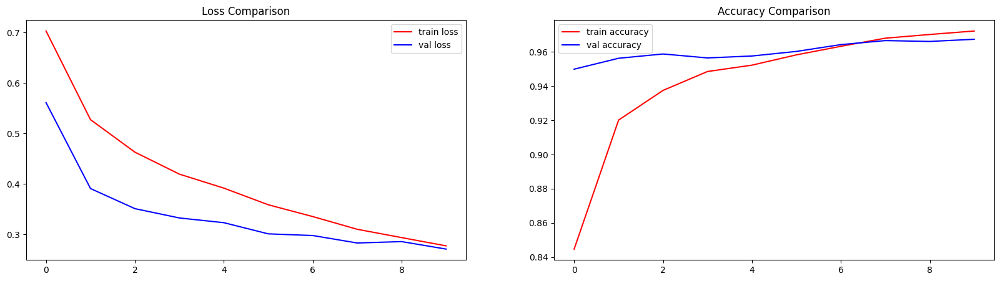

In [ ]:
import matplotlib.pyplot as plt
fig, axis = plt.subplots(1, 2, figsize=(20, 5))
axis[0].plot(history1.history["loss"], color='r', label = 'train loss')
axis[0].plot(history1.history["val_loss"], color='b', label = 'val loss')
axis[0].set_title('Loss Comparison')
axis[0].legend()
axis[1].plot(history1.history["accuracy"], color='r', label = 'train accuracy')
axis[1].plot(history1.history["val_accuracy"], color='b', label = 'val accuracy')
axis[1].set_title('Accuracy Comparison')
axis[1].legend()

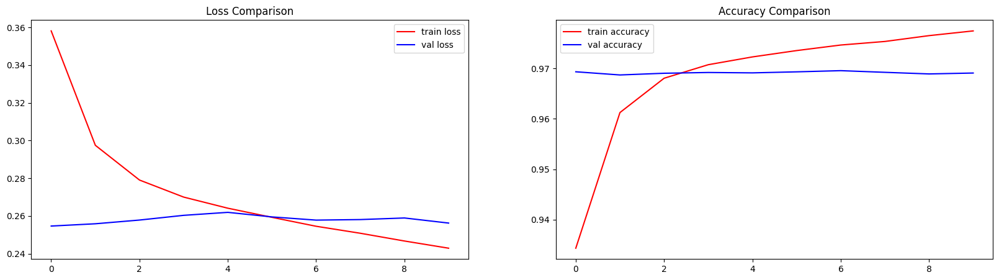

In [ ]:
import matplotlib.pyplot as plt
fig, axis = plt.subplots(1, 2, figsize=(20, 5))
axis[0].plot(history2.history["loss"], color='r', label = 'train loss')
axis[0].plot(history2.history["val_loss"], color='b', label = 'val loss')
axis[0].set_title('Loss Comparison')
axis[0].legend()
axis[1].plot(history2.history["accuracy"], color='r', label = 'train accuracy')
axis[1].plot(history2.history["val_accuracy"], color='b', label = 'val accuracy')
axis[1].set_title('Accuracy Comparison')
axis[1].legend()

In [ ]:
# Generate predictions for all images in the validation set
val_dataset = get_dataset(
    batch_size, img_size, val_input_img_paths, val_target_img_paths
)
val_preds = model.predict(val_dataset)

22/22 ━━━━━━━━━━━━━━━━━━━━ 21s 714ms/step


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageOps

def visualize_predictions(val_input_img_paths, val_target_img_paths, val_preds, indices=None, alpha=0.5):
    """
    Visualize predictions in a grid: original, GT mask, predicted mask, overlay.

    Args:
        val_input_img_paths: list of input image file paths
        val_target_img_paths: list of ground truth mask file paths
        val_preds: model predictions (numpy array)
        indices: list of indices to visualize (if None, random sample of 4)
        alpha: overlay transparency for prediction
    """
    if indices is None:
        indices = np.random.choice(len(val_input_img_paths), size=4, replace=False)

    n = len(indices)
    fig, axs = plt.subplots(n, 4, figsize=(16, 4*n))

    if n == 1:
        axs = [axs]  # ensure iterable if only one row

    for row, i in enumerate(indices):
        # Load original image
        orig = np.array(Image.open(val_input_img_paths[i]))

        # Load GT mask
        gt_mask = np.array(Image.open(val_target_img_paths[i]))

        # Get predicted mask (argmax over channels)
        pred_mask = np.argmax(val_preds[i], axis=-1).astype(np.uint8)

        # Resize prediction to original image size
        pred_mask_resized = np.array(Image.fromarray(pred_mask).resize(orig.shape[1::-1], resample=Image.NEAREST))

        # Overlay prediction on original image
        overlay = orig.copy()
        overlay = (alpha * np.stack([pred_mask_resized]*3, axis=-1) * 50 + (1-alpha) * overlay).astype(np.uint8)

        # Plotting
        axs[row][0].imshow(orig)
        axs[row][0].set_title("Original")
        axs[row][0].axis("off")

        axs[row][1].imshow(gt_mask, cmap="gray")
        axs[row][1].set_title("GT Mask")
        axs[row][1].axis("off")

        axs[row][2].imshow(pred_mask_resized, cmap="gray")
        axs[row][2].set_title("Pred Mask")
        axs[row][2].axis("off")

        axs[row][3].imshow(orig)
        axs[row][3].imshow(pred_mask_resized, cmap="jet", alpha=alpha)  # transparent overlay
        axs[row][3].set_title("Overlay")
        axs[row][3].axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
visualize_predictions(val_input_img_paths, val_target_img_paths, val_preds, indices=None, alpha=0.3)

In [ ]:
visualize_predictions(val_input_img_paths, val_target_img_paths, val_preds, indices=None, alpha=0.3)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

CATEGORY_COLORS = {
    0: [255, 230, 153],    # background
    1: [255, 0, 127],      # broad_leaf_weed
    2: [255, 0, 255],      # grassy_weed
    3: [0, 255, 0],        # soy_plant
}

def decode_mask(mask, category_colors=CATEGORY_COLORS):
    """
    Convert class index mask -> RGB mask using category colors.
    """
    h, w = mask.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_id, color in category_colors.items():
        rgb_mask[mask == cls_id] = color
    return rgb_mask

def visualize_predictions(val_input_img_paths, val_target_img_paths, val_preds, indices=None, alpha=0.5):
    """
    Visualize predictions in a grid: original, GT mask, predicted mask, overlay.

    Args:
        val_input_img_paths: list of input image file paths
        val_target_img_paths: list of ground truth mask file paths
        val_preds: model predictions (numpy array)
        indices: list of indices to visualize (if None, random sample of 4)
        alpha: overlay transparency for prediction
    """
    if indices is None:
        indices = np.random.choice(len(val_input_img_paths), size=4, replace=False)

    n = len(indices)
    fig, axs = plt.subplots(n, 4, figsize=(16, 4*n))

    if n == 1:
        axs = [axs]

    for row, i in enumerate(indices):
        # Original image
        orig = np.array(Image.open(val_input_img_paths[i]))

        # GT mask
        gt_mask = np.array(Image.open(val_target_img_paths[i]))
        gt_mask_rgb = decode_mask(gt_mask)

        # Prediction
        pred_mask = np.argmax(val_preds[i], axis=-1).astype(np.uint8)
        pred_mask_resized = np.array(
            Image.fromarray(pred_mask).resize(orig.shape[1::-1], resample=Image.NEAREST)
        )
        pred_mask_rgb = decode_mask(pred_mask_resized)

        # Overlay
        overlay = ((1 - alpha) * orig + alpha * pred_mask_rgb).astype(np.uint8)

        # Plotting
        axs[row][0].imshow(orig)
        axs[row][0].set_title("Original")
        axs[row][0].axis("off")

        axs[row][1].imshow(gt_mask_rgb)
        axs[row][1].set_title("GT Mask")
        axs[row][1].axis("off")

        axs[row][2].imshow(pred_mask_rgb)
        axs[row][2].set_title("Pred Mask")
        axs[row][2].axis("off")

        axs[row][3].imshow(overlay)
        axs[row][3].set_title("Overlay")
        axs[row][3].axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
visualize_predictions(val_input_img_paths, val_target_img_paths, val_preds, indices=None, alpha=0.3)

In [ ]:
visualize_predictions(val_input_img_paths, val_target_img_paths, val_preds, indices=None, alpha=0.3)

In [ ]:
# Serialize the model as a SavedModel.
# Use model.export for Keras models
model.export("unet_r50_segmentation")

import tensorflow as tf
# Convert to TFLite. This form of quantization is called
# post-training dynamic-range quantization in TFLite.
converter = tf.lite.TFLiteConverter.from_saved_model("unet_r50_segmentation")
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,  # Enable TensorFlow Lite ops.
    tf.lite.OpsSet.SELECT_TF_OPS,  # Enable TensorFlow ops.
]
tflite_model = converter.convert()
open("unet_r50_segmentation.tflite", "wb").write(tflite_model)

Saved artifact at 'unet_r50_segmentation'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name='keras_tensor_215')
Output Type:
  TensorSpec(shape=(None, 384, 384, 4), dtype=tf.float32, name=None)
Captures:
  135386495263824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135383834022480: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135383834021904: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135383834020368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135383834020752: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135383834020944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135383834020176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135383834023824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135383834024208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135383834023632: TensorSpec(shape=(), dtype=tf.resource, name=Non

44342184

In [ ]:
import tensorflow as tf
import numpy as np
import random
import matplotlib.pyplot as plt
from PIL import Image

# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="unet_r50_segmentation.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Get input shape (batch, h, w, c)
input_shape = input_details[0]['shape'][1:3]

def preprocess_image(img_path, target_size):
    img = Image.open(img_path).convert("RGB").resize(target_size, Image.BILINEAR)
    arr = np.array(img, dtype=np.float32) #/ 255.0  # normalize if needed
    return arr

def run_tflite_inference(img_path):
    img = preprocess_image(img_path, tuple(input_shape))
    inp = np.expand_dims(img, axis=0)  # add batch dim

    # Run inference
    interpreter.set_tensor(input_details[0]['index'], inp)
    interpreter.invoke()
    output = interpreter.get_tensor(output_details[0]['index'])[0]

    # Convert to predicted mask
    pred_mask = np.argmax(output, axis=-1).astype(np.uint8)
    return pred_mask

def visualize_predictions_tflite(val_input_img_paths, val_target_img_paths, indices=None, alpha=0.5):
    if indices is None:
        indices = np.random.choice(len(val_input_img_paths), size=4, replace=False)

    n = len(indices)
    fig, axs = plt.subplots(n, 4, figsize=(16, 4*n))

    if n == 1:
        axs = [axs]

    for row, i in enumerate(indices):
        # Load original image
        orig = np.array(Image.open(val_input_img_paths[i]).convert("RGB"))

        # Load GT mask
        gt_mask = np.array(Image.open(val_target_img_paths[i]))

        # Run inference with TFLite
        pred_mask = run_tflite_inference(val_input_img_paths[i])

        # Resize predicted mask back to original image size
        pred_mask_resized = np.array(Image.fromarray(pred_mask).resize(orig.shape[1::-1], resample=Image.NEAREST))

        # Overlay
        axs[row][0].imshow(orig)
        axs[row][0].set_title("Original")
        axs[row][0].axis("off")

        axs[row][1].imshow(gt_mask, cmap="gray")
        axs[row][1].set_title("GT Mask")
        axs[row][1].axis("off")

        axs[row][2].imshow(pred_mask_resized, cmap="gray")
        axs[row][2].set_title("Pred Mask")
        axs[row][2].axis("off")

        axs[row][3].imshow(orig)
        axs[row][3].imshow(pred_mask_resized, cmap="jet", alpha=alpha)
        axs[row][3].set_title("Overlay")
        axs[row][3].axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
visualize_predictions_tflite(val_input_img_paths, val_target_img_paths, alpha=0.5)

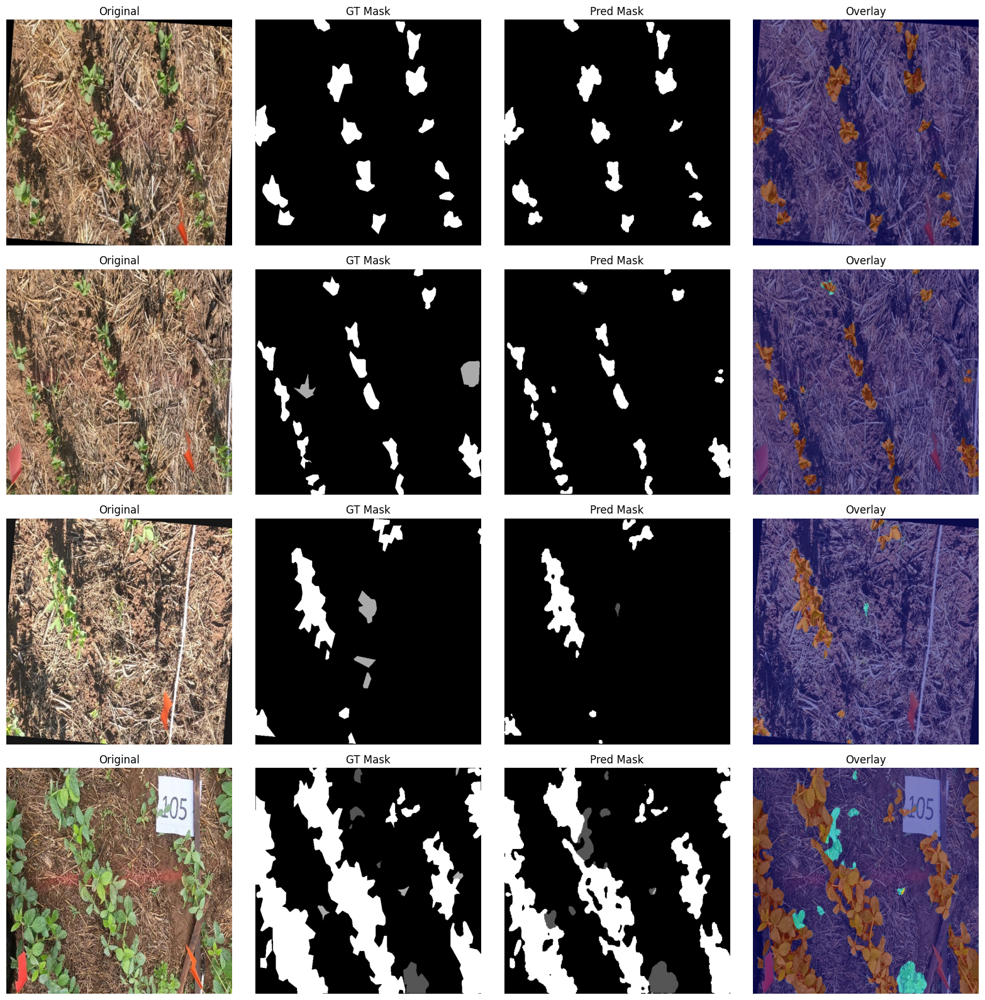

In [ ]:
import tensorflow as tf
import numpy as np
import random
import matplotlib.pyplot as plt
from PIL import Image

# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="unet_r50_segmentation.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Get input shape (batch, h, w, c)
input_shape = input_details[0]['shape'][1:3]

# Define category colors (R, G, B)
CATEGORY_COLORS = {
    0: [255, 230, 153],    # background
    1: [255, 0, 127],      # broad_leaf_weed
    2: [255, 0, 255],      # grassy_weed
    3: [0, 255, 0],        # soy_plant
}

def preprocess_image(img_path, target_size):
    img = Image.open(img_path).convert("RGB").resize(target_size, Image.BILINEAR)
    arr = np.array(img, dtype=np.float32)  # / 255.0  # normalize if needed
    return arr

def run_tflite_inference(img_path):
    img = preprocess_image(img_path, tuple(input_shape))
    inp = np.expand_dims(img, axis=0)  # add batch dim

    # Run inference
    interpreter.set_tensor(input_details[0]['index'], inp)
    interpreter.invoke()
    output = interpreter.get_tensor(output_details[0]['index'])[0]

    # Convert to predicted mask
    pred_mask = np.argmax(output, axis=-1).astype(np.uint8)
    return pred_mask

def decode_segmentation_mask(mask):
    """Map each label in mask to RGB color."""
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for label, color in CATEGORY_COLORS.items():
        color_mask[mask == label] = color
    return color_mask

def visualize_predictions_tflite(val_input_img_paths, val_target_img_paths, indices=None, alpha=0.5):
    if indices is None:
        indices = np.random.choice(len(val_input_img_paths), size=4, replace=False)

    n = len(indices)
    fig, axs = plt.subplots(n, 4, figsize=(16, 4*n))

    if n == 1:
        axs = [axs]

    for row, i in enumerate(indices):
        # Load original image
        orig = np.array(Image.open(val_input_img_paths[i]).convert("RGB"))

        # Load GT mask
        gt_mask = np.array(Image.open(val_target_img_paths[i]))
        gt_color = decode_segmentation_mask(gt_mask)

        # Run inference with TFLite
        pred_mask = run_tflite_inference(val_input_img_paths[i])

        # Resize predicted mask back to original image size
        pred_mask_resized = np.array(
            Image.fromarray(pred_mask).resize(orig.shape[1::-1], resample=Image.NEAREST)
        )
        pred_color = decode_segmentation_mask(pred_mask_resized)

        # Overlay prediction on original image
        overlay = ((1 - alpha) * orig + alpha * pred_color).astype(np.uint8)

        # Plotting
        axs[row][0].imshow(orig)
        axs[row][0].set_title("Original")
        axs[row][0].axis("off")

        axs[row][1].imshow(gt_color)
        axs[row][1].set_title("GT Mask (Color)")
        axs[row][1].axis("off")

        axs[row][2].imshow(pred_color)
        axs[row][2].set_title("Pred Mask (Color)")
        axs[row][2].axis("off")

        axs[row][3].imshow(overlay)
        axs[row][3].set_title("Overlay")
        axs[row][3].axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
visualize_predictions_tflite(val_input_img_paths, val_target_img_paths, alpha=0.3)

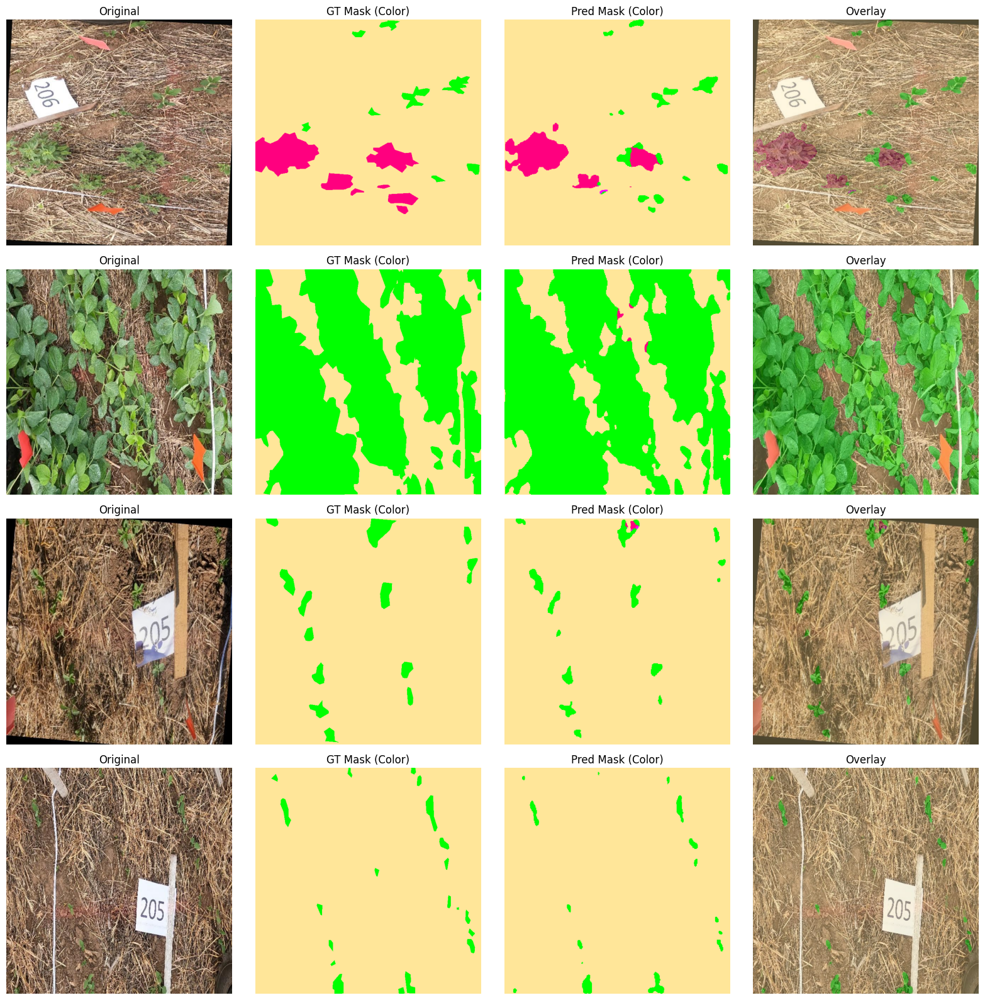

In [ ]:
visualize_predictions_tflite(val_input_img_paths, val_target_img_paths, alpha=0.3)

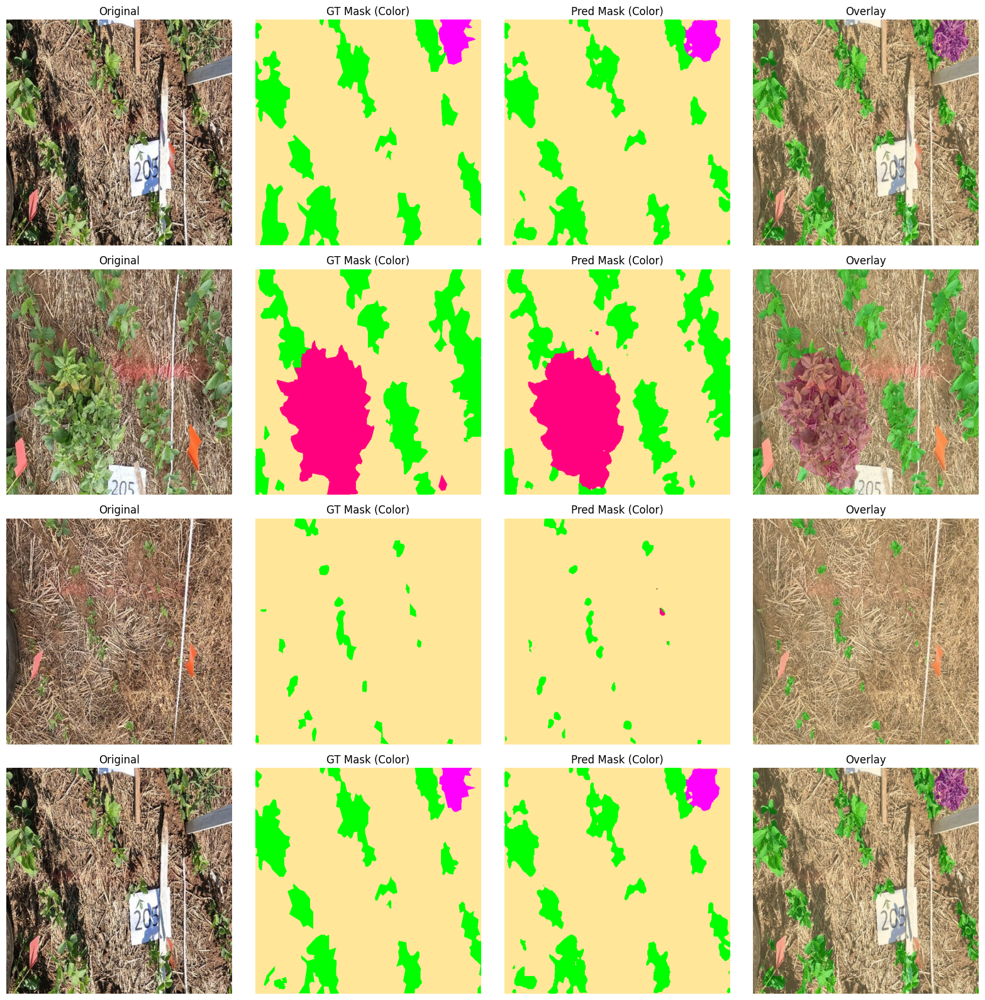